In [1]:
!pip install -q onnx onnxruntime requests


[notice] A new release of pip is available: 25.3 -> 26.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import requests

url = "https://raw.githubusercontent.com/kshitij435/cattle/main/left_right_live.onnx"

r = requests.get(url)
r.raise_for_status()

with open("left_right_live.onnx", "wb") as f:
    f.write(r.content)

print("Downloaded:", len(r.content) / (1024*1024), "MB")

c:\Users\tyler\AppData\Local\Programs\Python\Python311\Lib\site-packages\requests\__init__.py:113: RequestsDependencyWarning: urllib3 (2.6.2) or chardet (7.6.0)/charset_normalizer (3.4.4) doesn't match a supported version!
  warnings.warn(


Downloaded: 11.697850227355957 MB


In [3]:
from onnxruntime.quantization import quantize_dynamic, QuantType
import os

quantize_dynamic(
    "left_right_live.onnx",
    "left_right_live_int8.onnx",
    weight_type=QuantType.QUInt8
)

old = os.path.getsize("left_right_live.onnx") / (1024*1024)
new = os.path.getsize("left_right_live_int8.onnx") / (1024*1024)

print(f"Original : {old:.2f} MB")
print(f"INT8     : {new:.2f} MB")
print(f"Saved    : {old-new:.2f} MB")

Original : 11.70 MB
INT8     : 3.20 MB
Saved    : 8.50 MB


In [4]:
from pathlib import Path
import shutil

src = Path("left_right_live_int8.onnx")
dst = Path.home() / "Downloads" / "left_right_live_int8.onnx"

shutil.copy2(src, dst)

print("Saved to:", dst)

Saved to: C:\Users\tyler\Downloads\left_right_live_int8.onnx


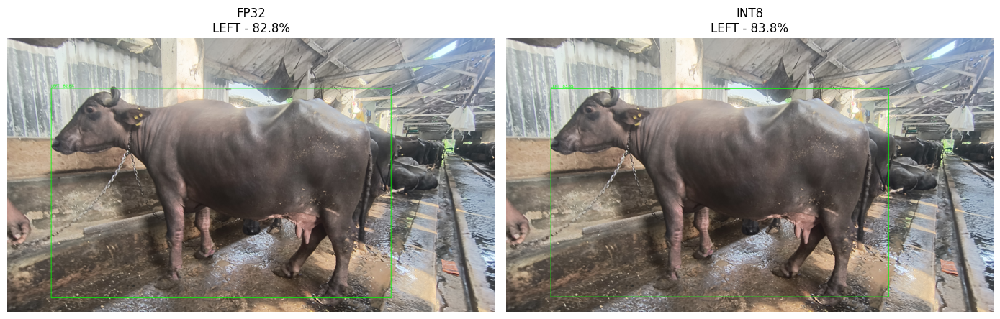

FP32 : LEFT 82.82%
INT8 : LEFT 83.84%
Same prediction: True


In [6]:
# SINGLE CELL: Compare FP32 vs INT8 on one image

import cv2
import numpy as np
import matplotlib.pyplot as plt
import onnxruntime as ort

# ============================================================
# CHANGE ONLY THIS
# ============================================================
IMAGE_PATH = input("Enter image path: ").strip().strip('"')
FP32_MODEL = "left_right_live.onnx"
INT8_MODEL = "left_right_live_int8.onnx"

# ============================================================
# LOAD MODELS
# ============================================================
fp32 = ort.InferenceSession(FP32_MODEL, providers=["CPUExecutionProvider"])
int8 = ort.InferenceSession(INT8_MODEL, providers=["CPUExecutionProvider"])

# ============================================================
# PREPROCESS
# ============================================================
def preprocess(img, size=640):
    h, w = img.shape[:2]

    scale = min(size / w, size / h)
    nw, nh = int(w * scale), int(h * scale)

    resized = cv2.resize(img, (nw, nh))

    canvas = np.full((size, size, 3), 114, dtype=np.uint8)

    pad_x = (size - nw) // 2
    pad_y = (size - nh) // 2

    canvas[pad_y:pad_y+nh, pad_x:pad_x+nw] = resized

    rgb = cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB)
    x = rgb.astype(np.float32) / 255.0
    x = np.transpose(x, (2, 0, 1))
    x = np.expand_dims(x, 0)

    return x, scale, pad_x, pad_y


# ============================================================
# RUN MODEL
# ============================================================
def run_model(session, img):

    x, scale, pad_x, pad_y = preprocess(img)

    input_name = session.get_inputs()[0].name

    output = session.run(
        None,
        {input_name: x}
    )[0][0]       # [6, 8400]

    # Find strongest LEFT and RIGHT detections
    left_idx = np.argmax(output[4])
    right_idx = np.argmax(output[5])

    left_score = float(output[4, left_idx])
    right_score = float(output[5, right_idx])

    if left_score >= right_score:
        cls = "LEFT"
        score = left_score
        idx = left_idx
    else:
        cls = "RIGHT"
        score = right_score
        idx = right_idx

    # Box
    cx, cy, bw, bh = output[0:4, idx]

    x1 = int((cx - bw/2 - pad_x) / scale)
    y1 = int((cy - bh/2 - pad_y) / scale)
    x2 = int((cx + bw/2 - pad_x) / scale)
    y2 = int((cy + bh/2 - pad_y) / scale)

    # Clamp
    h, w = img.shape[:2]
    x1 = max(0, min(w, x1))
    y1 = max(0, min(h, y1))
    x2 = max(0, min(w, x2))
    y2 = max(0, min(h, y2))

    return cls, score, (x1, y1, x2, y2)


# ============================================================
# IMAGE
# ============================================================
img = cv2.imread(IMAGE_PATH)

if img is None:
    raise FileNotFoundError(f"Could not read image: {IMAGE_PATH}")

# ============================================================
# FP32
# ============================================================
fp_cls, fp_score, fp_box = run_model(fp32, img)

# ============================================================
# INT8
# ============================================================
int_cls, int_score, int_box = run_model(int8, img)

# ============================================================
# DRAW
# ============================================================
def draw_result(img, result):
    cls, score, box = result

    out = img.copy()

    x1, y1, x2, y2 = box

    cv2.rectangle(
        out,
        (x1, y1),
        (x2, y2),
        (0, 255, 0),
        3
    )

    text = f"{cls}  {score*100:.1f}%"

    cv2.putText(
        out,
        text,
        (x1, max(30, y1-10)),
        cv2.FONT_HERSHEY_SIMPLEX,
        1,
        (0, 255, 0),
        2
    )

    return cv2.cvtColor(out, cv2.COLOR_BGR2RGB)


fp_img = draw_result(img, (fp_cls, fp_score, fp_box))
int_img = draw_result(img, (int_cls, int_score, int_box))

# ============================================================
# DISPLAY
# ============================================================
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(fp_img)
plt.title(f"FP32\n{fp_cls} - {fp_score*100:.1f}%")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(int_img)
plt.title(f"INT8\n{int_cls} - {int_score*100:.1f}%")
plt.axis("off")

plt.tight_layout()
plt.show()

# ============================================================
# SUMMARY
# ============================================================
print("===================================")
print("FP32 :", fp_cls, f"{fp_score*100:.2f}%")
print("INT8 :", int_cls, f"{int_score*100:.2f}%")
print("Same prediction:", fp_cls == int_cls)
print("===================================")

In [7]:
# ============================================================
# FP32 vs INT8 - COMPLETE FOLDER COMPARISON
# ============================================================

import os
import glob
import time
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import onnxruntime as ort
from pathlib import Path

# ============================================================
# 1. GIVE FOLDER PATH
# ============================================================

FOLDER_PATH = input("Enter folder path: ").strip().strip('"')

FP32_MODEL = "left_right_live.onnx"
INT8_MODEL = "left_right_live_int8.onnx"

OUTPUT_DIR = Path("fp32_vs_int8_results")
OUTPUT_DIR.mkdir(exist_ok=True)

ANNOTATED_DIR = OUTPUT_DIR / "annotated"
ANNOTATED_DIR.mkdir(exist_ok=True)

# ============================================================
# 2. FIND ALL IMAGES
# ============================================================

extensions = ["*.jpg", "*.jpeg", "*.png", "*.webp", "*.JPG", "*.JPEG", "*.PNG"]

images = []

for ext in extensions:
    images.extend(glob.glob(os.path.join(FOLDER_PATH, ext)))

images = sorted(images)

print("=" * 70)
print("FP32 vs INT8 COMPARISON")
print("=" * 70)
print("Folder :", FOLDER_PATH)
print("Images :", len(images))
print("=" * 70)

if len(images) == 0:
    raise FileNotFoundError("No images found in the selected folder.")

# ============================================================
# 3. LOAD MODELS
# ============================================================

print("\nLoading FP32 model...")
fp32_session = ort.InferenceSession(
    FP32_MODEL,
    providers=["CPUExecutionProvider"]
)

print("Loading INT8 model...")
int8_session = ort.InferenceSession(
    INT8_MODEL,
    providers=["CPUExecutionProvider"]
)

print("Both models loaded.")

# ============================================================
# 4. PREPROCESS
# ============================================================

def preprocess(img, size=640):

    h, w = img.shape[:2]

    scale = min(size / w, size / h)

    nw = int(w * scale)
    nh = int(h * scale)

    resized = cv2.resize(img, (nw, nh))

    canvas = np.full(
        (size, size, 3),
        114,
        dtype=np.uint8
    )

    pad_x = (size - nw) // 2
    pad_y = (size - nh) // 2

    canvas[
        pad_y:pad_y + nh,
        pad_x:pad_x + nw
    ] = resized

    # BGR -> RGB
    rgb = cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB)

    x = rgb.astype(np.float32) / 255.0

    x = np.transpose(x, (2, 0, 1))

    x = np.expand_dims(x, 0)

    return x, scale, pad_x, pad_y


# ============================================================
# 5. IOU
# ============================================================

def calculate_iou(box1, box2):

    if box1 is None or box2 is None:
        return 0.0

    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])

    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter_w = max(0, x2 - x1)
    inter_h = max(0, y2 - y1)

    intersection = inter_w * inter_h

    area1 = max(0, box1[2] - box1[0]) * max(0, box1[3] - box1[1])
    area2 = max(0, box2[2] - box2[0]) * max(0, box2[3] - box2[1])

    union = area1 + area2 - intersection

    if union <= 0:
        return 0.0

    return intersection / union


# ============================================================
# 6. RUN MODEL
# ============================================================

def run_model(session, img):

    x, scale, pad_x, pad_y = preprocess(img)

    input_name = session.get_inputs()[0].name

    start = time.perf_counter()

    output = session.run(
        None,
        {input_name: x}
    )[0]

    latency = (time.perf_counter() - start) * 1000

    data = output[0]

    # Expected:
    # [6, 8400]
    #
    # 0 = cx
    # 1 = cy
    # 2 = width
    # 3 = height
    # 4 = left score
    # 5 = right score

    left_scores = data[4]
    right_scores = data[5]

    left_idx = int(np.argmax(left_scores))
    right_idx = int(np.argmax(right_scores))

    left_score = float(left_scores[left_idx])
    right_score = float(right_scores[right_idx])

    if left_score >= right_score:

        cls = "LEFT"
        score = left_score
        idx = left_idx

    else:

        cls = "RIGHT"
        score = right_score
        idx = right_idx

    # Box
    cx, cy, bw, bh = data[0:4, idx]

    x1 = (cx - bw / 2 - pad_x) / scale
    y1 = (cy - bh / 2 - pad_y) / scale

    x2 = (cx + bw / 2 - pad_x) / scale
    y2 = (cy + bh / 2 - pad_y) / scale

    h, w = img.shape[:2]

    x1 = max(0, min(w, x1))
    y1 = max(0, min(h, y1))

    x2 = max(0, min(w, x2))
    y2 = max(0, min(h, y2))

    box = [
        float(x1),
        float(y1),
        float(x2),
        float(y2)
    ]

    return {
        "class": cls,
        "confidence": score,
        "box": box,
        "latency_ms": latency
    }


# ============================================================
# 7. DRAW
# ============================================================

def draw_prediction(img, result, label_prefix):

    out = img.copy()

    cls = result["class"]
    conf = result["confidence"]
    box = result["box"]

    if box is not None:

        x1, y1, x2, y2 = map(int, box)

        cv2.rectangle(
            out,
            (x1, y1),
            (x2, y2),
            (0, 255, 0),
            3
        )

        text = f"{label_prefix}: {cls} {conf*100:.1f}%"

        cv2.putText(
            out,
            text,
            (x1, max(30, y1 - 10)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.8,
            (0, 255, 0),
            2
        )

    return out


# ============================================================
# 8. PROCESS ALL IMAGES
# ============================================================

results = []

print("\nProcessing images...\n")

for i, image_path in enumerate(images, 1):

    filename = os.path.basename(image_path)

    img = cv2.imread(image_path)

    if img is None:

        print("SKIPPED:", filename)

        continue

    # FP32
    fp32 = run_model(
        fp32_session,
        img
    )

    # INT8
    int8 = run_model(
        int8_session,
        img
    )

    # Agreement
    same_class = (
        fp32["class"] == int8["class"]
    )

    # Box IoU
    box_iou = calculate_iou(
        fp32["box"],
        int8["box"]
    )

    # Confidence difference
    conf_difference = (
        abs(
            fp32["confidence"]
            -
            int8["confidence"]
        )
    )

    # Annotated comparison image
    fp_img = draw_prediction(
        img,
        fp32,
        "FP32"
    )

    int_img = draw_prediction(
        img,
        int8,
        "INT8"
    )

    combined = np.hstack(
        [
            fp_img,
            int_img
        ]
    )

    output_file = (
        ANNOTATED_DIR
        /
        filename
    )

    cv2.imwrite(
        str(output_file),
        combined
    )

    results.append({

        "image": filename,

        "FP32_prediction":
            fp32["class"],

        "INT8_prediction":
            int8["class"],

        "FP32_confidence":
            fp32["confidence"] * 100,

        "INT8_confidence":
            int8["confidence"] * 100,

        "Confidence_difference":
            conf_difference * 100,

        "FP32_x1":
            fp32["box"][0],

        "FP32_y1":
            fp32["box"][1],

        "FP32_x2":
            fp32["box"][2],

        "FP32_y2":
            fp32["box"][3],

        "INT8_x1":
            int8["box"][0],

        "INT8_y1":
            int8["box"][1],

        "INT8_x2":
            int8["box"][2],

        "INT8_y2":
            int8["box"][3],

        "Box_IoU":
            box_iou,

        "FP32_latency_ms":
            fp32["latency_ms"],

        "INT8_latency_ms":
            int8["latency_ms"],

        "Speed_change_%":
            (
                (
                    fp32["latency_ms"]
                    -
                    int8["latency_ms"]
                )
                /
                fp32["latency_ms"]
                * 100
            ),

        "Same_prediction":
            same_class
    })

    print(
        f"[{i}/{len(images)}] "
        f"{filename} | "
        f"FP32={fp32['class']} "
        f"{fp32['confidence']*100:.1f}% | "
        f"INT8={int8['class']} "
        f"{int8['confidence']*100:.1f}% | "
        f"Same={same_class}"
    )


# ============================================================
# 9. DATAFRAME
# ============================================================

df = pd.DataFrame(results)

# Save full report
csv_path = OUTPUT_DIR / "fp32_vs_int8_report.csv"

df.to_csv(
    csv_path,
    index=False
)

# ============================================================
# 10. FINAL SUMMARY MATRIX
# ============================================================

total = len(df)

same_count = int(
    df["Same_prediction"].sum()
)

different_count = total - same_count

agreement = (
    same_count / total * 100
)

avg_fp32_latency = df[
    "FP32_latency_ms"
].mean()

avg_int8_latency = df[
    "INT8_latency_ms"
].mean()

avg_fp32_conf = df[
    "FP32_confidence"
].mean()

avg_int8_conf = df[
    "INT8_confidence"
].mean()

avg_iou = df[
    "Box_IoU"
].mean()

avg_speed_change = df[
    "Speed_change_%"
].mean()


# ============================================================
# 11. PRINT MATRIX
# ============================================================

print("\n")
print("=" * 80)
print("FINAL FP32 vs INT8 MATRIX")
print("=" * 80)

print(
    pd.DataFrame({
        "Metric": [
            "Images",
            "Same prediction",
            "Different prediction",
            "Agreement %",
            "Average FP32 confidence %",
            "Average INT8 confidence %",
            "Average Box IoU",
            "Average FP32 latency (ms)",
            "Average INT8 latency (ms)",
            "Average speed improvement %"
        ],

        "Result": [
            total,
            same_count,
            different_count,
            round(agreement, 2),
            round(avg_fp32_conf, 2),
            round(avg_int8_conf, 2),
            round(avg_iou, 3),
            round(avg_fp32_latency, 2),
            round(avg_int8_latency, 2),
            round(avg_speed_change, 2)
        ]
    }).to_string(index=False)
)

# ============================================================
# 12. PREDICTION CONFUSION MATRIX
# ============================================================

matrix = pd.crosstab(
    df["FP32_prediction"],
    df["INT8_prediction"],
    rownames=["FP32"],
    colnames=["INT8"],
    dropna=False
)

print("\n")
print("=" * 80)
print("PREDICTION AGREEMENT MATRIX")
print("=" * 80)

print(matrix)

# ============================================================
# 13. SHOW ALL IMAGE RESULTS
# ============================================================

print("\n")
print("=" * 80)
print("DETAILED IMAGE RESULTS")
print("=" * 80)

display(
    df[
        [
            "image",
            "FP32_prediction",
            "INT8_prediction",
            "FP32_confidence",
            "INT8_confidence",
            "Confidence_difference",
            "Box_IoU",
            "FP32_latency_ms",
            "INT8_latency_ms",
            "Speed_change_%",
            "Same_prediction"
        ]
    ].round(2)
)

print("\n")
print("CSV saved to:")
print(csv_path)

print("\nAnnotated images saved to:")
print(ANNOTATED_DIR)

FP32 vs INT8 COMPARISON
Folder : C:\Users\tyler\Desktop\dhuru_dataset\setone_yolo3\merged_data3
Images : 402

Loading FP32 model...
Loading INT8 model...
Both models loaded.

Processing images...

[1/402] cattle142_1.jpg | FP32=RIGHT 61.3% | INT8=RIGHT 72.6% | Same=True
[2/402] cattle142_1.jpg | FP32=RIGHT 61.3% | INT8=RIGHT 72.6% | Same=True
[3/402] cattle142_2.jpg | FP32=RIGHT 15.9% | INT8=RIGHT 39.1% | Same=True
[4/402] cattle142_2.jpg | FP32=RIGHT 15.9% | INT8=RIGHT 39.1% | Same=True
[5/402] cattle142_3.jpg | FP32=RIGHT 14.1% | INT8=RIGHT 16.4% | Same=True
[6/402] cattle142_3.jpg | FP32=RIGHT 14.1% | INT8=RIGHT 16.4% | Same=True
[7/402] cattle142_4.jpg | FP32=RIGHT 82.2% | INT8=RIGHT 88.9% | Same=True
[8/402] cattle142_4.jpg | FP32=RIGHT 82.2% | INT8=RIGHT 88.9% | Same=True
[9/402] cattle142_5.jpg | FP32=LEFT 4.5% | INT8=LEFT 4.5% | Same=True
[10/402] cattle142_5.jpg | FP32=LEFT 4.5% | INT8=LEFT 4.5% | Same=True
[11/402] cattle142_6.jpg | FP32=LEFT 2.7% | INT8=LEFT 4.4% | Same=True

,image,FP32_prediction,INT8_prediction,FP32_confidence,INT8_confidence,Confidence_difference,Box_IoU,FP32_latency_ms,INT8_latency_ms,Speed_change_%,Same_prediction
0,cattle142_1.jpg,RIGHT,RIGHT,61.28,72.58,11.30,0.99,58.19,84.51,-45.22,True
1,cattle142_1.jpg,RIGHT,RIGHT,61.28,72.58,11.30,0.99,44.57,79.89,-79.27,True
2,cattle142_2.jpg,RIGHT,RIGHT,15.90,39.09,23.19,0.79,38.40,109.36,-184.75,True
3,cattle142_2.jpg,RIGHT,RIGHT,15.90,39.09,23.19,0.79,42.02,82.12,-95.45,True
4,cattle142_3.jpg,RIGHT,RIGHT,14.07,16.35,2.28,0.99,42.79,112.20,-162.22,True
...,...,...,...,...,...,...,...,...,...,...,...
397,cattle174_3.jpg,LEFT,LEFT,2.95,6.40,3.45,0.99,37.02,66.73,-80.27,True
398,cattle174_4.jpg,LEFT,LEFT,1.42,3.43,2.02,0.99,27.75,64.49,-132.40,True
399,cattle174_4.jpg,LEFT,LEFT,1.42,3.43,2.02,0.99,34.19,64.93,-89.93,True
400,cattle174_5.jpg,LEFT,LEFT,12.15,20.31,8.16,0.97,35.58,64.37,-80.93,True




CSV saved to:
fp32_vs_int8_results\fp32_vs_int8_report.csv

Annotated images saved to:
fp32_vs_int8_results\annotated


compress front head model

In [8]:
!pip install -q ultralytics onnx onnxruntime


[notice] A new release of pip is available: 25.3 -> 26.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [10]:
MODEL_PATH = r"C:\Users\tyler\Downloads\best (1).pt"

import os

print("Model exists:", os.path.exists(MODEL_PATH))
print("Model size:", os.path.getsize(MODEL_PATH) / (1024 * 1024), "MB")

Model exists: True
Model size: 21.47770118713379 MB


In [11]:
from ultralytics import YOLO

model = YOLO(MODEL_PATH)

print("Model loaded successfully")

Model loaded successfully


In [12]:
exported = model.export(
    format="onnx",
    imgsz=640,
    opset=12,
    simplify=True
)

print("Exported:", exported)

Ultralytics 8.4.0  Python-3.11.9 torch-2.6.0+cu124 CPU (11th Gen Intel Core i5-11400H @ 2.70GHz)
 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs

PyTorch: starting from 'C:\Users\tyler\Downloads\best (1).pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (21.5 MB)
requirements: Ultralytics requirements ['onnxslim>=0.1.71', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
WARNING Retry 1/2 failed: Command 'pip install --no-cache-dir "onnxslim>=0.1.71" "onnxruntime-gpu" ' returned non-zero exit status 1.
WARNING Retry 2/2 failed: Command 'pip install --no-cache-dir "onnxslim>=0.1.71" "onnxruntime-gpu" ' returned non-zero exit status 1.
WARNING requirements:  Command 'pip install --no-cache-dir "onnxslim>=0.1.71" "onnxruntime-gpu" ' returned non-zero exit status 1.
   ------------------

In [13]:
import os

ONNX_PATH = os.path.splitext(MODEL_PATH)[0] + ".onnx"

print("ONNX path:")
print(ONNX_PATH)

print("\nONNX size:")
print(round(os.path.getsize(ONNX_PATH) / (1024 * 1024), 2), "MB")

ONNX path:
C:\Users\tyler\Downloads\best (1).onnx

ONNX size:
42.65 MB


In [14]:
import onnx

onnx_model = onnx.load(ONNX_PATH)
onnx.checker.check_model(onnx_model)

print("ONNX model is valid ✅")

ONNX model is valid ✅


In [15]:
from onnxruntime.quantization import quantize_dynamic, QuantType

INT8_PATH = os.path.splitext(ONNX_PATH)[0] + "_int8.onnx"

quantize_dynamic(
    ONNX_PATH,
    INT8_PATH,
    weight_type=QuantType.QUInt8
)

print("INT8 model created:")
print(INT8_PATH)

INT8 model created:
C:\Users\tyler\Downloads\best (1)_int8.onnx


In [16]:
fp32_size = os.path.getsize(ONNX_PATH) / (1024 * 1024)
int8_size = os.path.getsize(INT8_PATH) / (1024 * 1024)

saved = fp32_size - int8_size
reduction = (saved / fp32_size) * 100

print("=" * 50)
print("MODEL SIZE COMPARISON")
print("=" * 50)

print(f"FP32 ONNX : {fp32_size:.2f} MB")
print(f"INT8 ONNX : {int8_size:.2f} MB")
print(f"Saved     : {saved:.2f} MB")
print(f"Reduction : {reduction:.2f}%")

MODEL SIZE COMPARISON
FP32 ONNX : 42.65 MB
INT8 ONNX : 10.95 MB
Saved     : 31.70 MB
Reduction : 74.33%


In [17]:
import onnxruntime as ort

session = ort.InferenceSession(
    INT8_PATH,
    providers=["CPUExecutionProvider"]
)

print("INT8 ONNX loaded successfully ✅")

print("\nInput:")
print(session.get_inputs()[0].name)
print(session.get_inputs()[0].shape)

print("\nOutput:")
print(session.get_outputs()[0].name)
print(session.get_outputs()[0].shape)

INT8 ONNX loaded successfully ✅

Input:
images
[1, 3, 640, 640]

Output:
output0
[1, 5, 8400]


In [20]:
from ultralytics import YOLO

fp32_model = YOLO(ONNX_PATH)
int8_model = YOLO(INT8_PATH)

print("Both models loaded successfully ✅")

WARNING Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
WARNING Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
Both models loaded successfully ✅


In [24]:
import torch

print("CUDA available:", torch.cuda.is_available())
print("CUDA devices:", torch.cuda.device_count())

CUDA available: True
CUDA devices: 0


In [22]:
TEST_IMAGE = r"C:\Users\tyler\Desktop\dhuru_dataset\setone_yolo3\merged_data3\cattle144_5.jpg"

In [25]:
fp32_result = fp32_model.predict(
    TEST_IMAGE,
    imgsz=640,
    conf=0.25,
    device="cpu",
    verbose=False
)[0]

int8_result = int8_model.predict(
    TEST_IMAGE,
    imgsz=640,
    conf=0.25,
    device="cpu",
    verbose=False
)[0]

print("FP32 detections:", len(fp32_result.boxes))
print("INT8 detections:", len(int8_result.boxes))

Loading C:\Users\tyler\Downloads\best (1).onnx for ONNX Runtime inference...
Using ONNX Runtime 1.30.0 with CPUExecutionProvider
Loading C:\Users\tyler\Downloads\best (1)_int8.onnx for ONNX Runtime inference...
Using ONNX Runtime 1.30.0 with CPUExecutionProvider
FP32 detections: 1
INT8 detections: 1


In [26]:
print("\nFP32")
print("=" * 40)

for box in fp32_result.boxes:
    print(
        "Confidence:",
        float(box.conf[0])
    )

print("\nINT8")
print("=" * 40)

for box in int8_result.boxes:
    print(
        "Confidence:",
        float(box.conf[0])
    )


FP32
Confidence: 0.40886083245277405

INT8
Confidence: 0.2795425057411194


In [27]:
import time

def benchmark(model, image, runs=20):

    times = []

    # Warmup
    for _ in range(3):
        model.predict(
            image,
            imgsz=640,
            conf=0.25,
            verbose=False
        )

    for _ in range(runs):

        start = time.perf_counter()

        model.predict(
            image,
            imgsz=640,
            conf=0.25,
            verbose=False
        )

        end = time.perf_counter()

        times.append((end - start) * 1000)

    return sum(times) / len(times)


fp32_time = benchmark(fp32_model, TEST_IMAGE)
int8_time = benchmark(int8_model, TEST_IMAGE)

print("=" * 50)
print("INFERENCE SPEED")
print("=" * 50)

print(f"FP32 : {fp32_time:.2f} ms")
print(f"INT8 : {int8_time:.2f} ms")

INFERENCE SPEED
FP32 : 236.32 ms
INT8 : 299.19 ms


In [28]:
print("=" * 60)
print("FINAL MODEL COMPARISON")
print("=" * 60)

print(f"FP32 ONNX size : {fp32_size:.2f} MB")
print(f"INT8 ONNX size : {int8_size:.2f} MB")
print(f"Size reduction : {reduction:.2f}%")

print()

print(f"FP32 latency   : {fp32_time:.2f} ms")
print(f"INT8 latency   : {int8_time:.2f} ms")

if int8_time < fp32_time:
    speedup = fp32_time / int8_time
    print(f"INT8 speed     : {speedup:.2f}x faster")
else:
    slowdown = int8_time / fp32_time
    print(f"INT8 speed     : {slowdown:.2f}x slower")

print("=" * 60)

FINAL MODEL COMPARISON
FP32 ONNX size : 42.65 MB
INT8 ONNX size : 10.95 MB
Size reduction : 74.33%

FP32 latency   : 236.32 ms
INT8 latency   : 299.19 ms
INT8 speed     : 1.27x slower


Total images found: 402
Images selected: 20

Running FP32 + INT8 comparison...

[1/20] cattle163_4.jpg
[2/20] cattle151_7.jpg
[3/20] cattle144_3.jpg
[4/20] cattle171_1.jpg
[5/20] cattle165_5.jpg
[6/20] cattle163_3.jpg
[7/20] cattle161_3.jpg
[8/20] cattle153_5.jpg
[9/20] cattle170_5.jpg
[10/20] cattle151_2.jpg
[11/20] cattle166_3.jpg
[12/20] cattle154_7.jpg
[13/20] cattle149_7.jpg
[14/20] cattle159_3.jpg
[15/20] cattle144_6.jpg
[16/20] cattle144_7.jpg
[17/20] cattle144_6.jpg
[18/20] cattle150_3.jpg
[19/20] cattle160_8.jpg
[20/20] cattle162_2.jpg

Comparison completed ✅


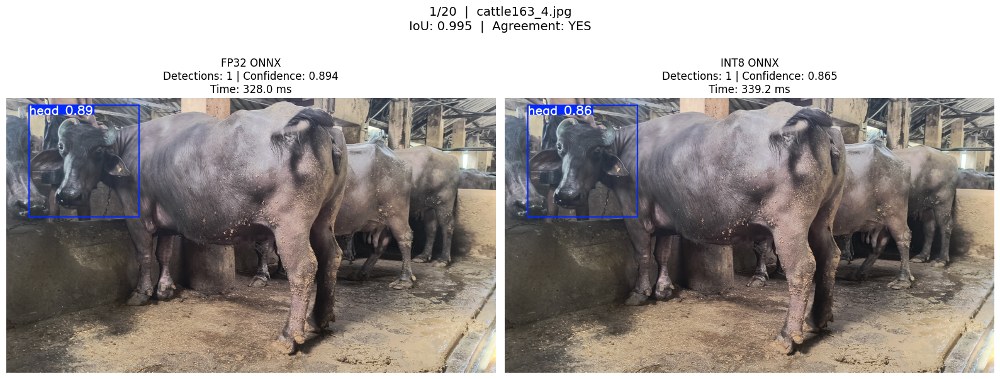

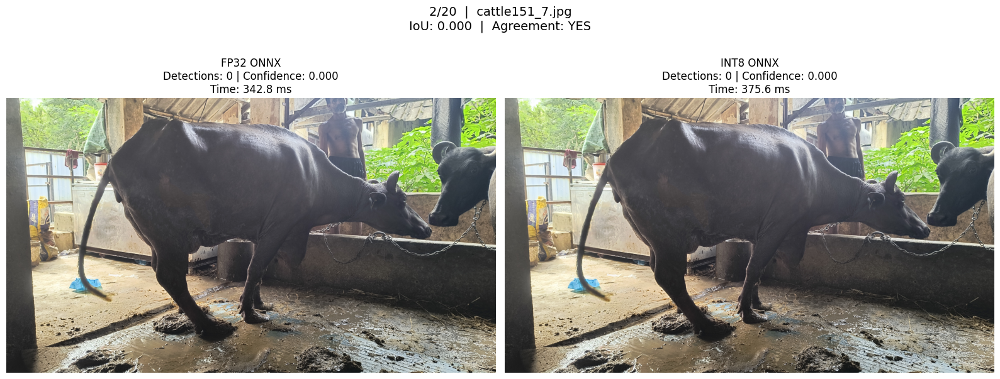

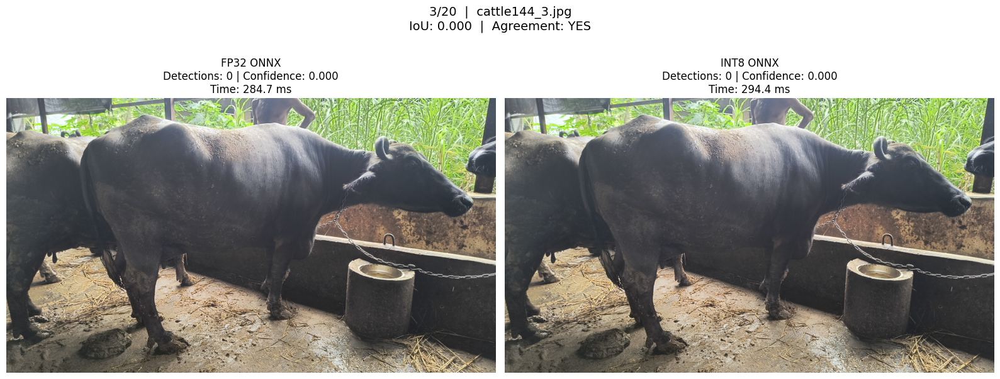

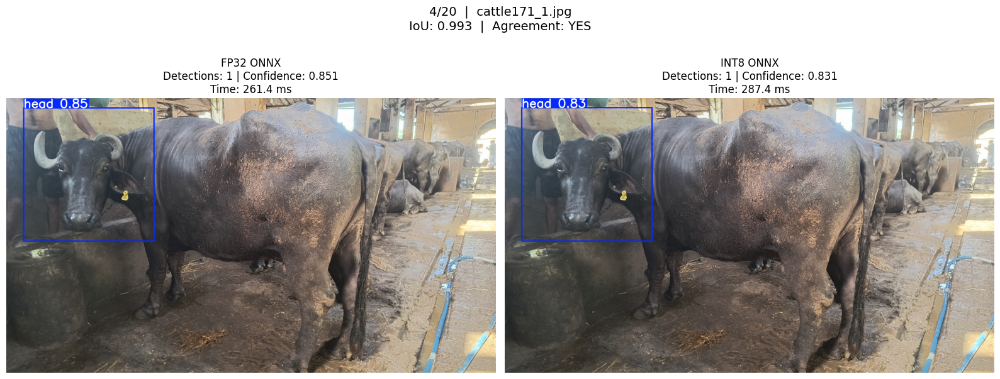

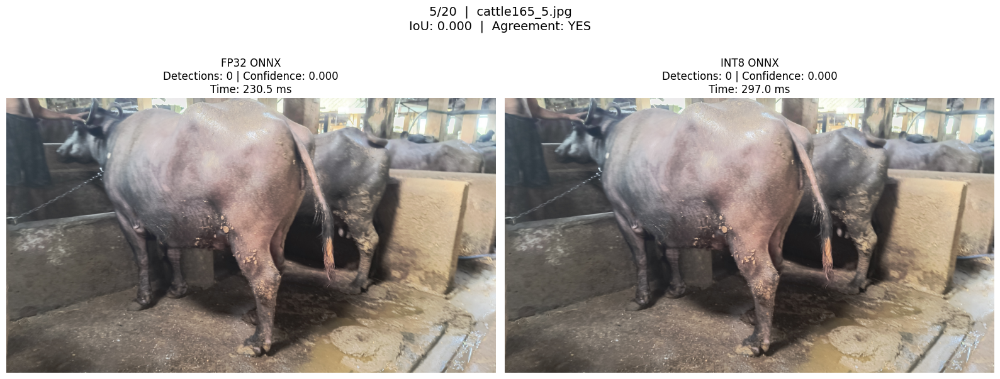

...

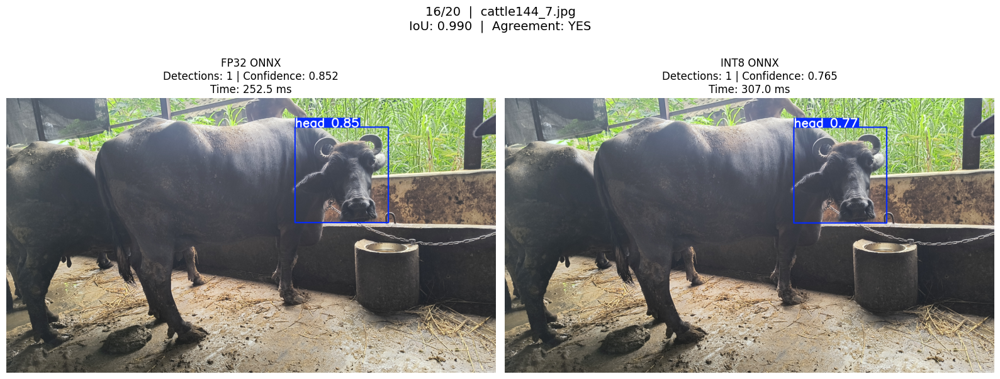

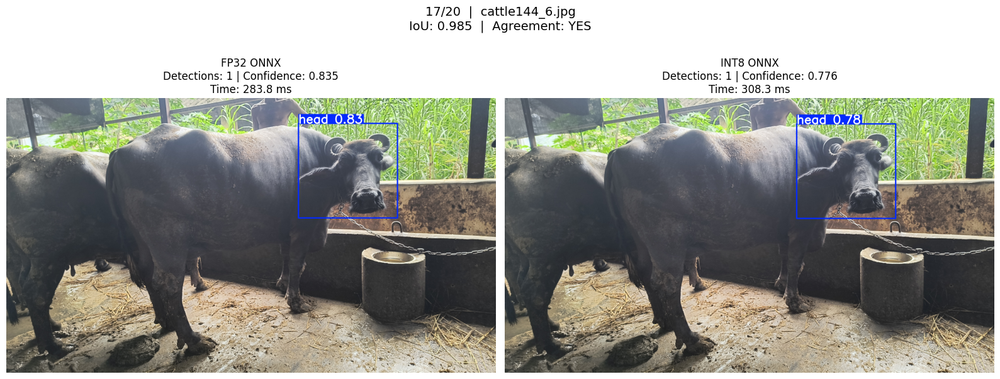

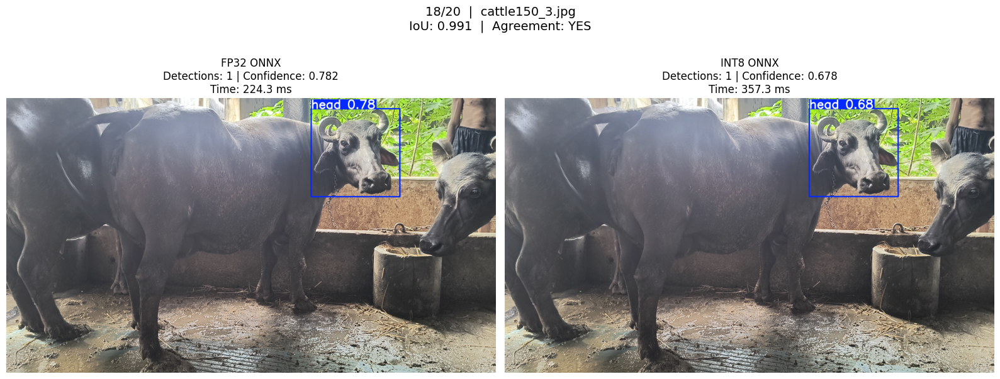

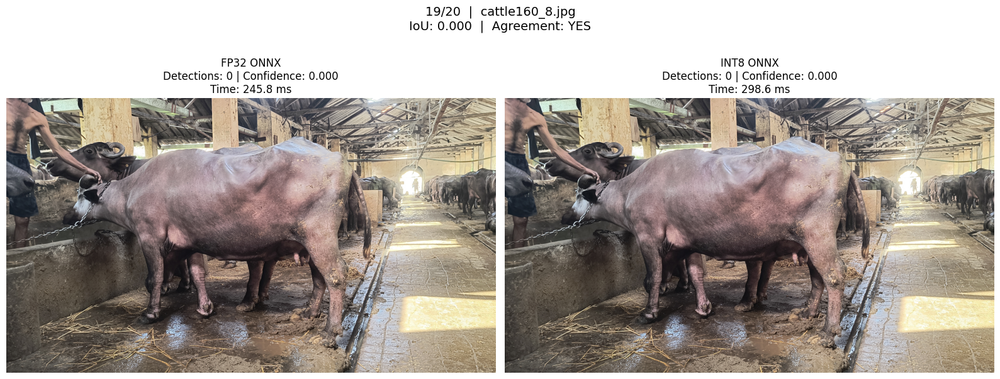

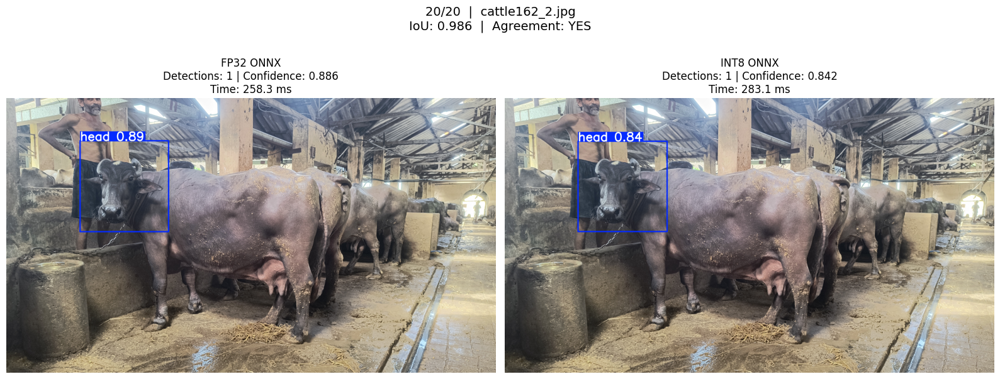



FINAL FP32 vs INT8 COMPARISON


,Image,FP32_Detections,INT8_Detections,FP32_Confidence,INT8_Confidence,Confidence_Diff,Box_IoU,FP32_Time_ms,INT8_Time_ms,Agreement
0,cattle163_4.jpg,1,1,0.894409,0.864982,0.029426,0.995209,327.9779,339.1659,YES
1,cattle151_7.jpg,0,0,0.000000,0.000000,0.000000,0.000000,342.8370,375.6327,YES
2,cattle144_3.jpg,0,0,0.000000,0.000000,0.000000,0.000000,284.6840,294.3839,YES
3,cattle171_1.jpg,1,1,0.850684,0.830629,0.020056,0.992800,261.4050,287.3914,YES
4,cattle165_5.jpg,0,0,0.000000,0.000000,0.000000,0.000000,230.4740,296.9845,YES
5,cattle163_3.jpg,1,1,0.863779,0.832157,0.031623,0.987944,266.6868,302.8642,YES
6,cattle161_3.jpg,1,1,0.794329,0.791343,0.002987,0.984099,229.7463,362.5479,YES
7,cattle153_5.jpg,1,1,0.614284,0.429761,0.184524,0.816637,242.7117,300.9145,YES
8,cattle170_5.jpg,1,1,0.907865,0.902169,0.005696,0.996501,248.6899,315.6305,YES
9,cattle151_2.jpg,0,0,0.000000,0.000000,0.000000,0.000000,255.4737,273.0203,YES




FINAL SUMMARY
Images tested             : 20
Prediction agreement      : 20/20 (100.00%)
Average Box IoU            : 0.6824
Average FP32 confidence   : 0.5644
Average INT8 confidence   : 0.5236
Average confidence diff   : 0.0408
Average FP32 latency      : 260.27 ms
Average INT8 latency      : 307.08 ms
INT8 speed                : 1.18x slower


PREDICTION AGREEMENT MATRIX


INT8 detections,0,1,2
FP32 detections,,,
0,6,0,0
1,0,13,0
2,0,0,1



CSV saved:
C:\Users\tyler\Desktop\dhuru_dataset\setone_yolo3\merged_data3\fp32_vs_int8_20_comparison.csv


In [29]:
# ============================================================
# FINAL FP32 vs INT8 COMPARISON
# Random 20 images + side-by-side predictions + final matrix
# ============================================================

import os
import glob
import random
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 1. GIVE YOUR IMAGE FOLDER HERE
# ------------------------------------------------------------

IMAGE_FOLDER = r"C:\Users\tyler\Desktop\dhuru_dataset\setone_yolo3\merged_data3"

# Number of random images
N_IMAGES = 20

# Same settings for both models
IMG_SIZE = 640
CONF_THRESHOLD = 0.25

# ------------------------------------------------------------
# 2. FIND IMAGES
# ------------------------------------------------------------

extensions = [
    "*.jpg", "*.jpeg", "*.png",
    "*.JPG", "*.JPEG", "*.PNG"
]

image_paths = []

for ext in extensions:
    image_paths.extend(
        glob.glob(os.path.join(IMAGE_FOLDER, ext))
    )

if len(image_paths) == 0:
    raise ValueError("No images found in folder!")

print("Total images found:", len(image_paths))

# Pick random 20
random.seed(42)

if len(image_paths) > N_IMAGES:
    selected_images = random.sample(image_paths, N_IMAGES)
else:
    selected_images = image_paths

print("Images selected:", len(selected_images))


# ------------------------------------------------------------
# 3. IOU FUNCTION
# ------------------------------------------------------------

def calculate_iou(box1, box2):

    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])

    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection = max(0, x2 - x1) * max(0, y2 - y1)

    area1 = max(0, box1[2] - box1[0]) * \
            max(0, box1[3] - box1[1])

    area2 = max(0, box2[2] - box2[0]) * \
            max(0, box2[3] - box2[1])

    union = area1 + area2 - intersection

    if union <= 0:
        return 0.0

    return intersection / union


# ------------------------------------------------------------
# 4. RUN BOTH MODELS
# ------------------------------------------------------------

results = []

print("\nRunning FP32 + INT8 comparison...\n")

for idx, image_path in enumerate(selected_images, 1):

    image_name = os.path.basename(image_path)

    print(f"[{idx}/{len(selected_images)}] {image_name}")

    # -------------------------
    # FP32
    # -------------------------

    start = time.perf_counter()

    fp32_result = fp32_model.predict(
        source=image_path,
        imgsz=IMG_SIZE,
        conf=CONF_THRESHOLD,
        device="cpu",
        verbose=False
    )[0]

    fp32_time = (time.perf_counter() - start) * 1000

    # -------------------------
    # INT8
    # -------------------------

    start = time.perf_counter()

    int8_result = int8_model.predict(
        source=image_path,
        imgsz=IMG_SIZE,
        conf=CONF_THRESHOLD,
        device="cpu",
        verbose=False
    )[0]

    int8_time = (time.perf_counter() - start) * 1000


    # --------------------------------------------------------
    # FP32 DATA
    # --------------------------------------------------------

    fp32_boxes = []

    if fp32_result.boxes is not None:

        for box in fp32_result.boxes:

            coords = box.xyxy[0].cpu().numpy()

            fp32_boxes.append({
                "box": coords,
                "confidence": float(box.conf[0]),
                "class": int(box.cls[0])
            })


    # --------------------------------------------------------
    # INT8 DATA
    # --------------------------------------------------------

    int8_boxes = []

    if int8_result.boxes is not None:

        for box in int8_result.boxes:

            coords = box.xyxy[0].cpu().numpy()

            int8_boxes.append({
                "box": coords,
                "confidence": float(box.conf[0]),
                "class": int(box.cls[0])
            })


    # --------------------------------------------------------
    # BEST BOX COMPARISON
    # --------------------------------------------------------

    if len(fp32_boxes) > 0 and len(int8_boxes) > 0:

        # Highest confidence detection
        fp32_best = max(
            fp32_boxes,
            key=lambda x: x["confidence"]
        )

        int8_best = max(
            int8_boxes,
            key=lambda x: x["confidence"]
        )

        box_iou = calculate_iou(
            fp32_best["box"],
            int8_best["box"]
        )

        fp32_conf = fp32_best["confidence"]
        int8_conf = int8_best["confidence"]

        confidence_difference = abs(
            fp32_conf - int8_conf
        )

    else:

        box_iou = 0

        fp32_conf = (
            max([x["confidence"] for x in fp32_boxes])
            if fp32_boxes else 0
        )

        int8_conf = (
            max([x["confidence"] for x in int8_boxes])
            if int8_boxes else 0
        )

        confidence_difference = abs(
            fp32_conf - int8_conf
        )


    # --------------------------------------------------------
    # AGREEMENT
    # --------------------------------------------------------

    same_detection_count = (
        len(fp32_boxes) == len(int8_boxes)
    )

    if (
        len(fp32_boxes) > 0
        and len(int8_boxes) > 0
        and box_iou >= 0.50
    ):
        prediction_agreement = "YES"
    elif (
        len(fp32_boxes) == 0
        and len(int8_boxes) == 0
    ):
        prediction_agreement = "YES"
    else:
        prediction_agreement = "NO"


    # --------------------------------------------------------
    # STORE
    # --------------------------------------------------------

    results.append({

        "Image": image_name,

        "FP32_Detections":
            len(fp32_boxes),

        "INT8_Detections":
            len(int8_boxes),

        "FP32_Confidence":
            fp32_conf,

        "INT8_Confidence":
            int8_conf,

        "Confidence_Diff":
            confidence_difference,

        "Box_IoU":
            box_iou,

        "FP32_Time_ms":
            fp32_time,

        "INT8_Time_ms":
            int8_time,

        "Agreement":
            prediction_agreement
    })


print("\nComparison completed ✅")


# ============================================================
# 5. SHOW 20 IMAGES SIDE-BY-SIDE
# ============================================================

for i, image_path in enumerate(selected_images):

    row = results[i]

    fp32_result = fp32_model.predict(
        source=image_path,
        imgsz=IMG_SIZE,
        conf=CONF_THRESHOLD,
        device="cpu",
        verbose=False
    )[0]

    int8_result = int8_model.predict(
        source=image_path,
        imgsz=IMG_SIZE,
        conf=CONF_THRESHOLD,
        device="cpu",
        verbose=False
    )[0]

    fp32_img = fp32_result.plot()
    int8_img = int8_result.plot()

    # Convert BGR -> RGB
    fp32_img = fp32_img[:, :, ::-1]
    int8_img = int8_img[:, :, ::-1]

    plt.figure(figsize=(16, 7))

    # -------------------------
    # FP32
    # -------------------------

    plt.subplot(1, 2, 1)

    plt.imshow(fp32_img)

    plt.title(
        f"FP32 ONNX\n"
        f"Detections: {row['FP32_Detections']} | "
        f"Confidence: {row['FP32_Confidence']:.3f}\n"
        f"Time: {row['FP32_Time_ms']:.1f} ms"
    )

    plt.axis("off")


    # -------------------------
    # INT8
    # -------------------------

    plt.subplot(1, 2, 2)

    plt.imshow(int8_img)

    plt.title(
        f"INT8 ONNX\n"
        f"Detections: {row['INT8_Detections']} | "
        f"Confidence: {row['INT8_Confidence']:.3f}\n"
        f"Time: {row['INT8_Time_ms']:.1f} ms"
    )

    plt.axis("off")


    plt.suptitle(
        f"{i+1}/{len(selected_images)}  |  "
        f"{row['Image']}\n"
        f"IoU: {row['Box_IoU']:.3f}  |  "
        f"Agreement: {row['Agreement']}",
        fontsize=14
    )

    plt.tight_layout()
    plt.show()


# ============================================================
# 6. FINAL MATRIX
# ============================================================

df_compare = pd.DataFrame(results)

print("\n")
print("=" * 100)
print("FINAL FP32 vs INT8 COMPARISON")
print("=" * 100)

display(df_compare)


# ============================================================
# 7. SUMMARY
# ============================================================

total = len(df_compare)

agreement_count = (
    df_compare["Agreement"] == "YES"
).sum()

agreement_percent = (
    agreement_count / total * 100
)

avg_iou = df_compare["Box_IoU"].mean()

avg_fp32_conf = (
    df_compare["FP32_Confidence"].mean()
)

avg_int8_conf = (
    df_compare["INT8_Confidence"].mean()
)

avg_fp32_time = (
    df_compare["FP32_Time_ms"].mean()
)

avg_int8_time = (
    df_compare["INT8_Time_ms"].mean()
)

avg_conf_diff = (
    df_compare["Confidence_Diff"].mean()
)


print("\n")
print("=" * 70)
print("FINAL SUMMARY")
print("=" * 70)

print(f"Images tested             : {total}")

print(
    f"Prediction agreement      : "
    f"{agreement_count}/{total} "
    f"({agreement_percent:.2f}%)"
)

print(
    f"Average Box IoU            : "
    f"{avg_iou:.4f}"
)

print(
    f"Average FP32 confidence   : "
    f"{avg_fp32_conf:.4f}"
)

print(
    f"Average INT8 confidence   : "
    f"{avg_int8_conf:.4f}"
)

print(
    f"Average confidence diff   : "
    f"{avg_conf_diff:.4f}"
)

print(
    f"Average FP32 latency      : "
    f"{avg_fp32_time:.2f} ms"
)

print(
    f"Average INT8 latency      : "
    f"{avg_int8_time:.2f} ms"
)

if avg_int8_time < avg_fp32_time:

    speedup = avg_fp32_time / avg_int8_time

    print(
        f"INT8 speed                : "
        f"{speedup:.2f}x faster"
    )

else:

    slowdown = avg_int8_time / avg_fp32_time

    print(
        f"INT8 speed                : "
        f"{slowdown:.2f}x slower"
    )

print("=" * 70)


# ============================================================
# 8. AGREEMENT MATRIX
# ============================================================

print("\n")
print("=" * 70)
print("PREDICTION AGREEMENT MATRIX")
print("=" * 70)

agreement_matrix = pd.crosstab(
    df_compare["FP32_Detections"],
    df_compare["INT8_Detections"],
    rownames=["FP32 detections"],
    colnames=["INT8 detections"]
)

display(agreement_matrix)


# ============================================================
# 9. SAVE CSV
# ============================================================

CSV_PATH = os.path.join(
    IMAGE_FOLDER,
    "fp32_vs_int8_20_comparison.csv"
)

df_compare.to_csv(
    CSV_PATH,
    index=False
)

print("\nCSV saved:")
print(CSV_PATH)